# Diffusion Optimization
This project showcases the different optimization techniques that exist for improving inference speed and memory consumption for a forward pass of SD 1.5.


Disclaimer: Some portions of this notebook were created with the help of generative AI (Google Gemini 3.0).

## Setup

Run these cells before conducting any benchmarks.


In [1]:
from google.colab import userdata

In [2]:
import torch
print(torch.version.cuda)

12.6


In [3]:
from diffusers import UNet2DConditionModel
import torch

print("Downloading model to cache...")
UNet2DConditionModel.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    subfolder="unet",
    torch_dtype=torch.float16,
    token=userdata.get('hf_token')
)
print("Download complete!")

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Download complete!


In [4]:
def remove_compilation_artifacts():
  torch._dynamo.reset()
remove_compilation_artifacts()

In [5]:
import gc
def cleanup():
  torch.cuda.empty_cache()
  gc.collect()

In [6]:
N_SAMPLES = 50

In [7]:
%%writefile inputs.py
import torch
B = 8 # Global B for batch size
SEED = 42

def get_inputs(device, dtype):
    generator = torch.Generator(device=device).manual_seed(SEED)

    H, W = 64, 64

    latents = torch.randn((B, 4, H, W), dtype=dtype, device=device, generator=generator)
    t = torch.randint(0, 1000, (B,), device=device, dtype=torch.long, generator=generator)
    encoder_hidden_states = torch.randn((B, 77, 768), dtype=dtype, device=device, generator=generator)

    return latents, t, encoder_hidden_states

Writing inputs.py


In [8]:
import importlib
import inputs # Import the module first
importlib.reload(inputs) # Then reload it
from inputs import get_inputs, B, SEED # Then import get_inputs and B

In [9]:
torch.manual_seed(SEED)
import random
random.seed(SEED)
import numpy as np
np.random.seed(SEED)

## Basic Benchmark (Size + Speed)
Benchmarks using the python performance profiler.

In [ ]:
from torch.nn.attention import SDPBackend
attention_optim = SDPBackend.EFFICIENT_ATTENTION # Change to SDPBackend.FLASH_ATTENTION when using Ampere Cards and above (A10+).

### SD-1.5 float32 without FlashAttention and xFormers Memory Optimization (Naive)

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
from inputs import get_inputs, B # Import B here

def benchmark_naive_math_float32():
    device = "cuda"
    dtype = torch.float32

    print("1. Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    # Define the queue (number of passes you want to observe)
    queue = [{"id": i} for i in range(N_SAMPLES)]

    print("2. Warming up...")
    # Compile Kernels.
    with torch.nn.attention.sdpa_kernel(SDPBackend.MATH):
        with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    print(f"3. Running Benchmark ({len(queue)} iterations)...")
    torch.cuda.synchronize()
    torch.cuda.reset_peak_memory_stats(device=device)

    with torch.nn.attention.sdpa_kernel(SDPBackend.MATH):
        with torch.inference_mode():
            for i, step in enumerate(queue, start=1):
                torch.cuda.synchronize()

                step_start = perf_counter()

                # One forward pass (Predicting noise for one timestep)
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

                torch.cuda.synchronize()

                step['time'] = perf_counter() - step_start

    # --- RESULTS ---
    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step['time'] for step in queue) / len(queue)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet

print("----- Benchmarking: float32 -----")
cleanup()
benchmark_naive_math_float32()
cleanup()

----- Benchmarking: float32 -----
1. Loading model...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


2. Warming up...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 381.86 ms
Average Forward Pass (per sample): 47.73 ms
Max Memory Used:      13.64 GB


### SD-1.5 float16 without FlashAttention and xFormers Memory Optimization (Naive)

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
from inputs import get_inputs, B # Import B here

def benchmark_naive_math_float16():
    device = "cuda"
    dtype = torch.float16

    print("1. Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    queue = [{"id": i} for i in range(N_SAMPLES)]

    print("2. Warming up...")
    # Compile Kernels.
    with torch.nn.attention.sdpa_kernel(SDPBackend.MATH):
        with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    torch.cuda.synchronize()
    print(f"3. Running Benchmark ({len(queue)} iterations)...")
    torch.cuda.reset_peak_memory_stats(device=device)

    with torch.nn.attention.sdpa_kernel(SDPBackend.MATH):
        with torch.inference_mode():
            for i, step in enumerate(queue, start=1):
                torch.cuda.synchronize()

                step_start = perf_counter()

                # One forward pass (Predicting noise for one timestep)
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

                torch.cuda.synchronize()

                step['time'] = perf_counter() - step_start

    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step['time'] for step in queue) / len(queue)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet

print("----- Benchmarking: float16 without Attention -----")
benchmark_naive_math_float16()
cleanup()

----- Benchmarking: float16 without Attention -----
1. Loading model...
2. Warming up...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 296.38 ms
Average Forward Pass (per sample): 37.05 ms
Max Memory Used:      11.81 GB


### SD-1.5 float16 with FlashAttention (standard since PyTorch 2.0)

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
from inputs import get_inputs, B # Import B here

def benchmark_flash_attention_python_timing():
    device = "cuda"
    dtype = torch.float16

    print("1. Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    queue = [{"id": i} for i in range(N_SAMPLES)]

    print("2. Warming up...")
    # Compile Kernels.
    with torch.nn.attention.sdpa_kernel(attention_optim):
        with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            torch.cuda.synchronize()

    print(f"3. Running Benchmark ({len(queue)} iterations)...")
    torch.cuda.reset_peak_memory_stats(device=device)

    with torch.nn.attention.sdpa_kernel(attention_optim):
        with torch.inference_mode():

            for i, step in enumerate(queue, start=1):
                torch.cuda.synchronize()

                step_start = perf_counter()

                # One forward pass (Predicting noise for one timestep)
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

                torch.cuda.synchronize()

                step['time'] = perf_counter() - step_start

    # --- RESULTS ---
    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step['time'] for step in queue) / len(queue)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet


print("----- Benchmarking: FLASH ATTENTION -----")
benchmark_flash_attention_python_timing()
cleanup()

----- Benchmarking: FLASH ATTENTION -----
1. Loading model...
2. Warming up...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 72.11 ms
Average Forward Pass (per sample): 9.01 ms
Max Memory Used:      2.29 GB


### SD-1.5 float16 without specifying Attention (Default)

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
from inputs import get_inputs, B # Import B here

def benchmark_flash_attention_python_timing():
    # Preparation.
    device = "cuda"
    dtype = torch.float16
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)
    latents, t, encoder_hidden_states = get_inputs(device, dtype)
    step_times = []

    # Warmup.
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            torch.cuda.synchronize()
    torch.cuda.reset_peak_memory_stats(device=device)

    # Benchmark.
    with torch.inference_mode():
            for _ in range(N_SAMPLES):
                torch.cuda.synchronize()
                step_start = perf_counter()
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)
                torch.cuda.synchronize()

                step_end = perf_counter()
                step_times.append(step_end - step_start)

    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step_times) / len(step_times)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet


print("----- Benchmarking: Pytorch default. -----")
benchmark_flash_attention_python_timing()
cleanup()

----- Benchmarking: Pytorch default. -----
Average Forward Pass (per batch): 63.25 ms
Average Forward Pass (per sample): 7.91 ms
Max Memory Used:      2.29 GB


### SD-1.5 float16 with FlashAttention (standard since PyTorch 2.0) and Channel Last

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
from inputs import get_inputs, B # Import B here

def benchmark_flash_attention_channel_last():
    device = "cuda"
    dtype = torch.float16

    print("1. Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)

    unet = unet.to(memory_format=torch.channels_last)

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    latents = latents.contiguous(memory_format=torch.channels_last)

    queue = [{"id": i} for i in range(N_SAMPLES)]

    print("2. Warming up...")
    # Compile Kernels
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            torch.cuda.synchronize()

    print(f"3. Running Benchmark ({len(queue)} iterations)...")
    torch.cuda.reset_peak_memory_stats(device=device)

    with torch.inference_mode():
            for i, step in enumerate(queue, start=1):
                torch.cuda.synchronize()

                step_start = perf_counter()

                # One forward pass (Predicting noise for one timestep)
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

                torch.cuda.synchronize()

                step['time'] = perf_counter() - step_start

    # --- RESULTS ---
    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step['time'] for step in queue) / len(queue)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet


print("----- Benchmarking: FLASH ATTENTION Channel Last-----")
benchmark_flash_attention_channel_last()
cleanup()

----- Benchmarking: FLASH ATTENTION Channel Last-----
1. Loading model...
2. Warming up...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 66.92 ms
Average Forward Pass (per sample): 8.36 ms
Max Memory Used:      2.29 GB


### SD-1.5 with torch.compile()



In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
from inputs import get_inputs, B # Import B here

def benchmark_flash_attention_python_timing_compile_channel_last():
    device = "cuda"
    dtype = torch.float16

    print("1. Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)

    unet = unet.to(memory_format=torch.channels_last)

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    latents = latents.contiguous(memory_format=torch.channels_last)
    queue = [{"id": i} for i in range(N_SAMPLES)]

    print("2. Warming up, Compiling...")
    # Compile Kernels.
    unet = torch.compile(unet, mode="max-autotune", fullgraph=True) # Compilation step.
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            torch.cuda.synchronize()

    print(f"3. Running Benchmark ({len(queue)} iterations)...")
    torch.cuda.reset_peak_memory_stats(device=device)

    with torch.inference_mode():
            for i, step in enumerate(queue, start=1):
                torch.cuda.synchronize()

                step_start = perf_counter()

                # One forward pass (Predicting noise for one timestep)
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

                torch.cuda.synchronize()

                step['time'] = perf_counter() - step_start

    # --- RESULTS ---
    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step['time'] for step in queue) / len(queue)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet


print("----- Benchmarking: torch.compile() + Channel Last -----")
cleanup()
benchmark_flash_attention_python_timing_compile_channel_last()
cleanup()

----- Benchmarking: torch.compile() + Channel Last -----
1. Loading model...
2. Warming up, Compiling...


/usr/local/lib/python3.12/dist-packages/torch/backends/__init__.py:42: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  return self.getter()
Autotune Choices Stats:
{"num_choices": 19, "num_triton_choices": 18, "best_kernel": "triton_mm_268", "best_kernel_desc": "ACC_TYPE='tl.float32', ALLOW_TF32=False, BLOCK_K=64, BLOCK_M=128, BLOCK_N=128, EVEN_K=True, GROUP_M=8, USE_FAST_ACCUM=False, num_stages=3, num_warps=4", "best_time": 0.15360000729560852, "best_triton_pos": 0}
AUTOTUNE mm(32768x1280, 1280x320)
stri

3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 48.95 ms
Average Forward Pass (per sample): 6.12 ms
Max Memory Used:      1.74 GB


### Advanced Compilation Settings

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
import torch._inductor.config as inductor_config
from inputs import get_inputs, B # Import B here

def benchmark_flash_attention_python_timing_compile_with_advanced_compil():
    inductor_config.coordinate_descent_tuning = True
    inductor_config.max_autotune = True
    inductor_config.triton.cudagraphs = True
    device = "cuda"
    dtype = torch.float16

    print("1. Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)

    unet = unet.to(memory_format=torch.channels_last)

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    latents = latents.contiguous(memory_format=torch.channels_last)
    queue = [{"id": i} for i in range(N_SAMPLES)]

    print("2. Warming up, Compiling...")
    # Compile Kernels.
    unet = torch.compile(unet, mode="max-autotune", fullgraph=True) # Compilation step.
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            torch.cuda.synchronize()

    print(f"3. Running Benchmark ({len(queue)} iterations)...")
    torch.cuda.reset_peak_memory_stats(device=device)

    with torch.inference_mode():
            for i, step in enumerate(queue, start=1):
                torch.cuda.synchronize()

                step_start = perf_counter()

                # One forward pass (Predicting noise for one timestep)
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

                torch.cuda.synchronize()

                step['time'] = perf_counter() - step_start

    # --- RESULTS ---
    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step['time'] for step in queue) / len(queue)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet


print("----- Benchmarking: torch.compile() + Channel Last + Advanced Compil -----")
before_cd = inductor_config.coordinate_descent_tuning
before_maxa = inductor_config.max_autotune
cgraphs = inductor_config.triton.cudagraphs

cleanup()
benchmark_flash_attention_python_timing_compile_with_advanced_compil()
cleanup()

inductor_config.coordinate_descent_tuning = before_cd
inductor_config.max_autotune = before_maxa
inductor_config.triton.cudagraphs = cgraphs

----- Benchmarking: torch.compile() + Channel Last + Advanced Compil -----
1. Loading model...
2. Warming up, Compiling...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 49.57 ms
Average Forward Pass (per sample): 6.20 ms
Max Memory Used:      1.73 GB


### (Manual) use of CUDA Graph without compilation

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend
from time import perf_counter
from inputs import get_inputs, B # Import B here

def benchmark_flash_attention_python_timing_compile_channel_last(dtype = torch.float16):
    device = "cuda"

    print("1. Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=dtype
    ).to(device)

    unet = unet.to(memory_format=torch.channels_last)

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    latents = latents.contiguous(memory_format=torch.channels_last)
    queue = [{"id": i} for i in range(N_SAMPLES)]

    print("2. Warming up, Compiling...")
    # Compile Kernels.

    s = torch.cuda.Stream()
    s.wait_stream(torch.cuda.current_stream())
    with torch.cuda.stream(s), torch.inference_mode():
            for _ in range(3):
                _ = unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            torch.cuda.synchronize()

    u_net_graph = torch.cuda.CUDAGraph()
    with torch.inference_mode():
      with torch.cuda.graph(u_net_graph):
        static_model_output = unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    print(f"3. Running Benchmark ({len(queue)} iterations)...")
    torch.cuda.reset_peak_memory_stats(device=device)

    with torch.inference_mode():
            for i, step in enumerate(queue, start=1):
                torch.cuda.synchronize()

                step_start = perf_counter()

                # One forward pass (Predicting noise for one timestep)
                u_net_graph.replay()

                torch.cuda.synchronize()

                step['time'] = perf_counter() - step_start

    # --- RESULTS ---
    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    avg_step_time = (sum(step['time'] for step in queue) / len(queue)) # This is average time per batch
    avg_step_time_per_sample = avg_step_time / B

    print(f"Average Forward Pass (per batch): {avg_step_time * 1000:.2f} ms")
    print(f"Average Forward Pass (per sample): {avg_step_time_per_sample * 1000:.2f} ms")
    print(f"Max Memory Used:      {max_memory} GB")

    return unet


print("----- Benchmarking: CUDA Graph-----")
cleanup()
benchmark_flash_attention_python_timing_compile_channel_last()
cleanup()

----- Benchmarking: CUDA Graph-----
1. Loading model...
2. Warming up, Compiling...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 64.61 ms
Average Forward Pass (per sample): 8.08 ms
Max Memory Used:      1.75 GB


## Kernel Benchmarks
Benchmarks for recording which kernels took the most GPU-time.

### Kernel Benchmark (Naive Math without Compilation, Channel First)

In [ ]:
import torch
import gc
from diffusers import UNet2DConditionModel
from torch.profiler import profile, ProfilerActivity
from torch.nn.attention import SDPBackend, sdpa_kernel
from inputs import get_inputs, B # Import B here

def profile_unet(unet):
    device = "cuda"
    dtype = torch.float16

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    print("1. Warming up...")
    with torch.nn.attention.sdpa_kernel(SDPBackend.MATH):
      with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    print("2. Profiling Kernels (Naive Math)...")

    with torch.nn.attention.sdpa_kernel(SDPBackend.MATH):
      with torch.inference_mode():
        with profile(activities=[ProfilerActivity.CUDA], record_shapes=True) as prof:
            unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # --- ANALYSIS ---
    print("\n--- Top 15 Kernels by GPU Time ---")
    try:
        print(prof.key_averages().table(sort_by="self_cuda_time_total", row_limit=15))
    except:
        print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=15))

    events = prof.key_averages()

    total_time = 0
    for e in events:
        t = getattr(e, "self_cuda_time_total", getattr(e, "device_time_total", getattr(e, "cuda_time_total", 0)))
        total_time += t

    total_time_per_batch = total_time
    print(f"Total GPU Time (for entire batch, batch size {B}): {total_time_per_batch / 1000:.2f} ms")
    print(f"Total GPU Time per sample: {(total_time_per_batch / B) / 1000:.2f} ms")

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

if __name__ == "__main__":
    device = "cuda"
    dtype = torch.float16

    cleanup()

    print("Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype=dtype
    ).to(device)

    profile_unet(unet)
    cleanup()

Loading model...
1. Warming up...
2. Profiling Kernels (Naive Math)...

--- Top 15 Kernels by GPU Time ---
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                ampere_sgemm_128x128_nn         0.00%       0.000us         0.00%       0.000us       0.000us     111.170ms        37.65%     111.170ms       1.765ms            63  
void at::native::elementwise_kernel<128, 2, at::nati...         0.00%       0.000us         0.00%   

### Kernel Benchmark (Flash Attention without Compilation, Channel First)

In [11]:
import torch
import gc
from diffusers import UNet2DConditionModel
from torch.profiler import profile, ProfilerActivity
from torch.nn.attention import SDPBackend, sdpa_kernel
from inputs import get_inputs, B

def profile_unet(unet):
    device = "cuda"
    dtype = torch.float16

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    # 1. Warmup
    print("1. Warming up...")
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # 2. Precise Timing (using CUDA Events)
    print("2. Measuring Latency (Flash Attention Only)...")
    start_event = torch.cuda.Event(enable_timing=True)
    end_event = torch.cuda.Event(enable_timing=True)

    with torch.inference_mode():
            torch.cuda.synchronize()
            start_event.record()

            unet(latents, t, encoder_hidden_states=encoder_hidden_states)

            end_event.record()
            torch.cuda.synchronize()

    # Calculate actual execution time
    total_time_ms = start_event.elapsed_time(end_event)
    print(f"Total GPU Time (Batch {B}): {total_time_ms:.2f} ms")
    print(f"Total GPU Time per sample: {total_time_ms / B:.2f} ms")

    # 3. Profiling.
    print("3. Profiling Kernels (Breakdown only)...")
    with torch.inference_mode():
            with profile(activities=[ProfilerActivity.CUDA], record_shapes=True) as prof:
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # --- ANALYSIS ---
    print("\n--- Top 15 Kernels by GPU Time ---")
    try:
        # Sort by self_cuda_time_total to see individual kernel costs
        print(prof.key_averages().table(sort_by="self_cuda_time_total", row_limit=15))
    except Exception as e:
        print(f"Could not print table: {e}")

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

if __name__ == "__main__":
    device = "cuda"
    dtype = torch.float16

    cleanup()

    print("Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype=dtype
    ).to(device)

    profile_unet(unet)
    cleanup()

Loading model...
1. Warming up...
2. Measuring Latency (Flash Attention Only)...
Total GPU Time (Batch 8): 455.07 ms
Total GPU Time per sample: 56.88 ms
3. Profiling Kernels (Breakdown only)...

--- Top 15 Kernels by GPU Time ---
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
fmha_cutlassF_f16_aligned_64x64_rf_sm75(PyTorchMemEf...         0.00%       0.000us         0.00%       0.000us       0.000us     117.434ms        25.69%     117.434ms      11

### Kernel Benchmark (Flash Attention with Compilation, Channel First)

In [ ]:
import torch
import gc
from diffusers import UNet2DConditionModel
from torch.profiler import profile, ProfilerActivity
from torch.nn.attention import SDPBackend, sdpa_kernel
from inputs import get_inputs, B

def profile_unet(unet):
    device = "cuda"
    dtype = torch.float16

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    unet = torch.compile(unet, mode="max-autotune", fullgraph=True) # Compilation step.

    # 1. Warmup
    print("1. Warming up...")
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # 2. Precise Timing (using CUDA Events)
    print("2. Measuring Latency (Flash Attention + Compilation)...")
    start_event = torch.cuda.Event(enable_timing=True)
    end_event = torch.cuda.Event(enable_timing=True)

    with torch.inference_mode():
            torch.cuda.synchronize()
            start_event.record()

            unet(latents, t, encoder_hidden_states=encoder_hidden_states)

            end_event.record()
            torch.cuda.synchronize()

    # Calculate actual execution time
    total_time_ms = start_event.elapsed_time(end_event)
    print(f"Total GPU Time (Batch {B}): {total_time_ms:.2f} ms")
    print(f"Total GPU Time per sample: {total_time_ms / B:.2f} ms")

    # 3. Profiling.
    print("3. Profiling Kernels (Breakdown only)...")
    with torch.inference_mode():
            with profile(activities=[ProfilerActivity.CUDA], record_shapes=True) as prof:
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # --- ANALYSIS ---
    print("\n--- Top 15 Kernels by GPU Time ---")
    try:
        # Sort by self_cuda_time_total to see individual kernel costs
        print(prof.key_averages().table(sort_by="self_cuda_time_total", row_limit=15))
    except Exception as e:
        print(f"Could not print table: {e}")

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

if __name__ == "__main__":
    device = "cuda"
    dtype = torch.float16

    cleanup()

    print("Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype=dtype
    ).to(device)

    profile_unet(unet)
    cleanup()

Loading model...
1. Warming up...
2. Measuring Latency (Flash Attention + Compilation)...
Total GPU Time (Batch 8): 57.78 ms
Total GPU Time per sample: 7.22 ms
3. Profiling Kernels (Breakdown only)...

--- Top 15 Kernels by GPU Time ---
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
void pytorch_flash::flash_fwd_kernel<Flash_fwd_kerne...         0.00%       0.000us         0.00%       0.000us       0.000us       9.314ms        19.43%       9.314ms 

### Kernel Benchmark (Flash Attention without Compilation, Channel Last)

In [10]:
import torch
import gc
from diffusers import UNet2DConditionModel
from torch.profiler import profile, ProfilerActivity
from torch.nn.attention import SDPBackend, sdpa_kernel
from inputs import get_inputs, B

def profile_unet(unet):
    device = "cuda"
    dtype = torch.float16

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    unet.to(memory_format=torch.channels_last)
    latents = latents.contiguous(memory_format=torch.channels_last)

    # 1. Warmup
    print("1. Warming up...")
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # 2. Precise Timing (using CUDA Events)
    print("2. Measuring Latency (Flash Attention + Channel Last)...")
    start_event = torch.cuda.Event(enable_timing=True)
    end_event = torch.cuda.Event(enable_timing=True)

    with torch.inference_mode():
            torch.cuda.synchronize()
            start_event.record()

            unet(latents, t, encoder_hidden_states=encoder_hidden_states)

            end_event.record()
            torch.cuda.synchronize()

    # Calculate actual execution time
    total_time_ms = start_event.elapsed_time(end_event)
    print(f"Total GPU Time (Batch {B}): {total_time_ms:.2f} ms")
    print(f"Total GPU Time per sample: {total_time_ms / B:.2f} ms")

    # 3. Profiling.
    print("3. Profiling Kernels (Breakdown only)...")
    with torch.inference_mode():
            with profile(activities=[ProfilerActivity.CUDA], record_shapes=True) as prof:
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # --- ANALYSIS ---
    print("\n--- Top 15 Kernels by GPU Time ---")
    try:
        # Sort by self_cuda_time_total to see individual kernel costs
        print(prof.key_averages().table(sort_by="self_cuda_time_total", row_limit=15))
    except Exception as e:
        print(f"Could not print table: {e}")

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

if __name__ == "__main__":
    device = "cuda"
    dtype = torch.float16

    cleanup()

    print("Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype=dtype
    ).to(device)

    profile_unet(unet)
    cleanup()

Loading model...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


1. Warming up...
2. Measuring Latency (Flash Attention + Channel Last)...
Total GPU Time (Batch 8): 467.04 ms
Total GPU Time per sample: 58.38 ms
3. Profiling Kernels (Breakdown only)...

--- Top 15 Kernels by GPU Time ---
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
fmha_cutlassF_f16_aligned_64x64_rf_sm75(PyTorchMemEf...         0.00%       0.000us         0.00%       0.000us       0.000us     107.455ms        23.40%     107.455ms      10.745ms 

### Kernel Benchmark (Flash Attention with Compilation, Channel Last)

In [ ]:
import torch
import gc
from diffusers import UNet2DConditionModel
from torch.profiler import profile, ProfilerActivity
from torch.nn.attention import SDPBackend, sdpa_kernel
from inputs import get_inputs, B

def profile_unet(unet):
    device = "cuda"
    dtype = torch.float16

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    unet.to(memory_format=torch.channels_last)
    latents = latents.contiguous(memory_format=torch.channels_last)

    unet.compile(mode="max-autotune", fullgraph=True) # Compilation step.

    # 1. Warmup
    print("1. Warming up...")
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # 2. Precise Timing (using CUDA Events)
    print("2. Measuring Latency (Flash Attention + Compilation + Channel Last)...")
    start_event = torch.cuda.Event(enable_timing=True)
    end_event = torch.cuda.Event(enable_timing=True)

    with torch.inference_mode():
            torch.cuda.synchronize()
            start_event.record()

            unet(latents, t, encoder_hidden_states=encoder_hidden_states)

            end_event.record()
            torch.cuda.synchronize()

    # Calculate actual execution time
    total_time_ms = start_event.elapsed_time(end_event)
    print(f"Total GPU Time (Batch {B}): {total_time_ms:.2f} ms")
    print(f"Total GPU Time per sample: {total_time_ms / B:.2f} ms")

    # 3. Profiling.
    print("3. Profiling Kernels (Breakdown only)...")
    with torch.inference_mode():
            with profile(activities=[ProfilerActivity.CUDA], record_shapes=True) as prof:
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # --- ANALYSIS ---
    print("\n--- Top 15 Kernels by GPU Time ---")
    try:
        # Sort by self_cuda_time_total to see individual kernel costs
        print(prof.key_averages().table(sort_by="self_cuda_time_total", row_limit=15))
    except Exception as e:
        print(f"Could not print table: {e}")

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

if __name__ == "__main__":
    device = "cuda"
    dtype = torch.float16

    cleanup()

    print("Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype=dtype
    ).to(device)

    profile_unet(unet)
    cleanup()

Loading model...
1. Warming up...
2. Measuring Latency (Flash Attention + Compilation + Channel Last)...
Total GPU Time (Batch 8): 53.96 ms
Total GPU Time per sample: 6.74 ms
3. Profiling Kernels (Breakdown only)...

--- Top 15 Kernels by GPU Time ---
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
void pytorch_flash::flash_fwd_kernel<Flash_fwd_kerne...         0.00%       0.000us         0.00%       0.000us       0.000us       7.755ms        17.40%

```
--- Top 15 Kernels by GPU Time ---
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  
fmha_cutlassF_f16_aligned_64x64_rf_sm75(PyTorchMemEf...      90.941ms        24.71%      90.941ms      10.105ms             9  
_5x_cudnn_turing_fp16_s1688cudnn_fp16_256x128_ldg8_r...      67.050ms        18.22%      67.050ms       2.915ms            23  
_5x_cudnn_turing_fp16_s1688cudnn_fp16_256x64_sliced1...      24.512ms         6.66%      24.512ms       2.724ms             9  
turing_fp16_s1688gemm_fp16_128x256_ldg8_f2f_stages_3...      22.776ms         6.19%      22.776ms     307.780us            74  
         turing_fp16_s1688gemm_fp16_256x128_ldg8_f2f_tn      21.280ms         5.78%      21.280ms     519.013us            41  
         turing_fp16_s1688gemm_fp16_128x128_ldg8_f2f_tn      19.965ms         5.42%      19.965ms     998.241us            20  
fmha_cutlassF_f16_aligned_32x128_rf_sm75(PyTorchMemE...      15.973ms         4.34%      15.973ms       1.597ms            10  
sm75_xmma_fprop_implicit_gemm_f16f16_f16f32_f32_nhwc...       9.285ms         2.52%       9.285ms     663.192us            14  
turing_fp16_s1688gemm_fp16_128x256_ldg8_relu_f2f_sta...       8.284ms         2.25%       8.284ms     306.806us            27  
triton_red_fused__to_copy__unsafe_index_add_addmm_ar...       7.737ms         2.10%       7.737ms       7.737ms             1  
triton_red_fused__to_copy__unsafe_index_add_addmm_ar...       7.170ms         1.95%       7.170ms       7.170ms             1  
triton_red_fused_add_addmm_cat_clone_convolution_div...       7.144ms         1.94%       7.144ms       7.144ms             1  
triton_red_fused__to_copy__unsafe_index_add_addmm_ar...       7.060ms         1.92%       7.060ms       7.060ms             1  
          triton_poi_fused_addmm_gelu_mul_split_view_13       4.993ms         1.36%       4.993ms     998.509us             5  
         turing_fp16_s1688gemm_fp16_128x256_ldg8_f2f_tn       4.868ms         1.32%       4.868ms     973.556us             5  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  
Self CPU time total: 397.936ms
Self CUDA time total: 368.023ms
```


### Isolated CUDA FlashAttention Kernel with Channel Last

In [ ]:
%%writefile cuda_attention.py
import torch
import gc
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend, sdpa_kernel
# Import the cuda profiler
import torch.cuda.profiler as profiler
from inputs import get_inputs, B # Import B here

def profile_unet(unet):
    device = "cuda"
    dtype = torch.float16

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    latents = latents.contiguous(memory_format=torch.channels_last)
    unet.to(memory_format=torch.channels_last)

    print("1. Warming up (ignored by ncu)...")
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # Synchronize to finish warmup
    torch.cuda.synchronize()

    print("2. Profiling...")
    with torch.inference_mode():
            # --- START CAPTURE ---
            profiler.start()
            unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            # --- STOP CAPTURE ---
            profiler.stop()

    torch.cuda.synchronize()
    print("Done.")

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

if __name__ == "__main__":
    # Silence TensorFlow logs
    import os
    os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

    device = "cuda"
    dtype = torch.float16

    cleanup()

    print("Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype=dtype
    ).to(device)

    profile_unet(unet)
    cleanup()

Writing cuda_attention.py


In [ ]:
!ncu --target-processes all \
    --profile-from-start off \
    --kernel-name regex:".*(flash|fmha|efficient|attention).*" \
    --set full \
    --section SpeedOfLight_HierarchicalTensorRooflineChart \
    -o unet_attention_profile \
    -f \
    python cuda_attention.py

==PROF== Connected to process 28096 (/usr/bin/python3.12)
2025-12-09 23:06:43.971323: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1765321603.993121   28096 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1765321603.999704   28096 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1765321604.016189   28096 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765321604.016227   28096 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765321604.016231

### Isolated CUDA FlashAttention Kernel with Channel Last and Compilation

In [ ]:
%%writefile cuda_attention_compiled.py
import torch
import gc
from diffusers import UNet2DConditionModel
from torch.nn.attention import SDPBackend, sdpa_kernel
# Import the cuda profiler
import torch.cuda.profiler as profiler
from inputs import get_inputs, B # Import B here

def profile_unet(unet):
    device = "cuda"
    dtype = torch.float16

    # Inputs
    latents, t, encoder_hidden_states = get_inputs(device, dtype)

    latents = latents.contiguous(memory_format=torch.channels_last)
    unet.to(memory_format=torch.channels_last)

    print("1. Warming up (ignored by ncu)...")
    with torch.inference_mode():
            for _ in range(3):
                unet(latents, t, encoder_hidden_states=encoder_hidden_states)

    # Synchronize to finish warmup
    torch.cuda.synchronize()

    print("2. Profiling...")
    with torch.inference_mode():
            # --- START CAPTURE ---
            profiler.start()
            unet(latents, t, encoder_hidden_states=encoder_hidden_states)
            # --- STOP CAPTURE ---
            profiler.stop()

    torch.cuda.synchronize()
    print("Done.")

def cleanup():
    torch.cuda.empty_cache()
    gc.collect()

if __name__ == "__main__":
    import os
    os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

    device = "cuda"
    dtype = torch.float16

    cleanup()

    print("Loading model...")
    unet = UNet2DConditionModel.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype=dtype
    ).to(device)

    profile_unet(unet)
    cleanup()

Writing cuda_attention_compiled.py


In [ ]:
!ncu --target-processes all \
    --profile-from-start off \
    --kernel-name regex:".*(flash|fmha|efficient|attention).*" \
    --set full \
    --section SpeedOfLight_HierarchicalTensorRooflineChart \
    -o unet_attention_compiled_profile \
    -f \
    python cuda_attention_compiled.py

==PROF== Connected to process 30135 (/usr/bin/python3.12)
2025-12-09 23:07:52.298377: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1765321672.320331   30135 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1765321672.326919   30135 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1765321672.343086   30135 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765321672.343112   30135 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765321672.343115

## Image Comparison

Image generation examples (50 steps, guidance scale 7.5). Stored in execution directory.

Note: The functionality depends on function definitions in the cells above.


--- Processing Vanilla: Landscape Photo of the Alps ---
Assembling Vanilla Pipeline for alps_vanilla.png...


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/50 [00:00<?, ?it/s]

Saving to alps_vanilla.png...
--- Processing Optimized: Landscape Photo of the Alps ---
1. Loading model...
2. Warming up, Compiling...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 64.72 ms
Average Forward Pass (per sample): 8.09 ms
Max Memory Used:      3.5 GB
Assembling Optimized Pipeline for alps_optim.png...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saving to alps_optim.png...


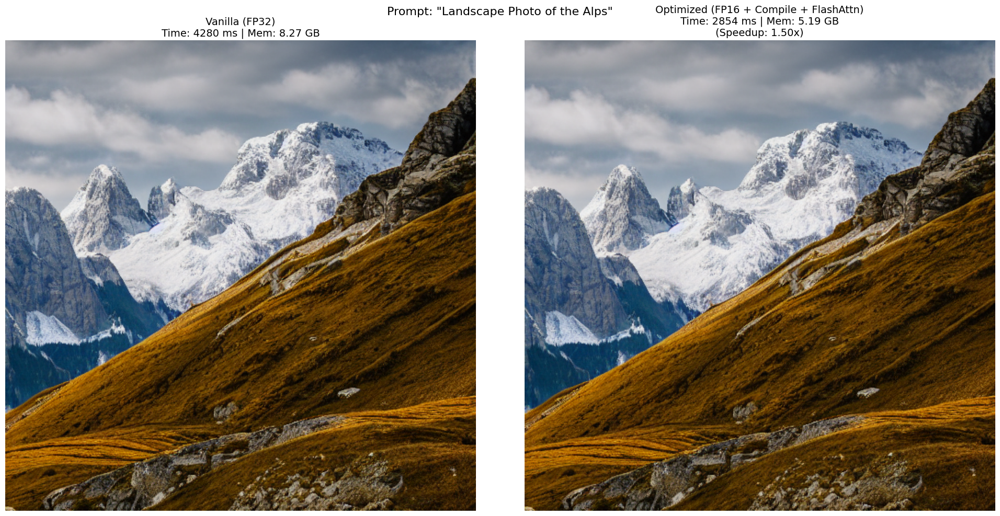


--- Processing Vanilla: Photo of a Beautiful Face ---
Assembling Vanilla Pipeline for face_vanilla.png...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saving to face_vanilla.png...
--- Processing Optimized: Photo of a Beautiful Face ---
1. Loading model...
2. Warming up, Compiling...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 64.76 ms
Average Forward Pass (per sample): 8.10 ms
Max Memory Used:      3.51 GB
Assembling Optimized Pipeline for face_optim.png...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saving to face_optim.png...


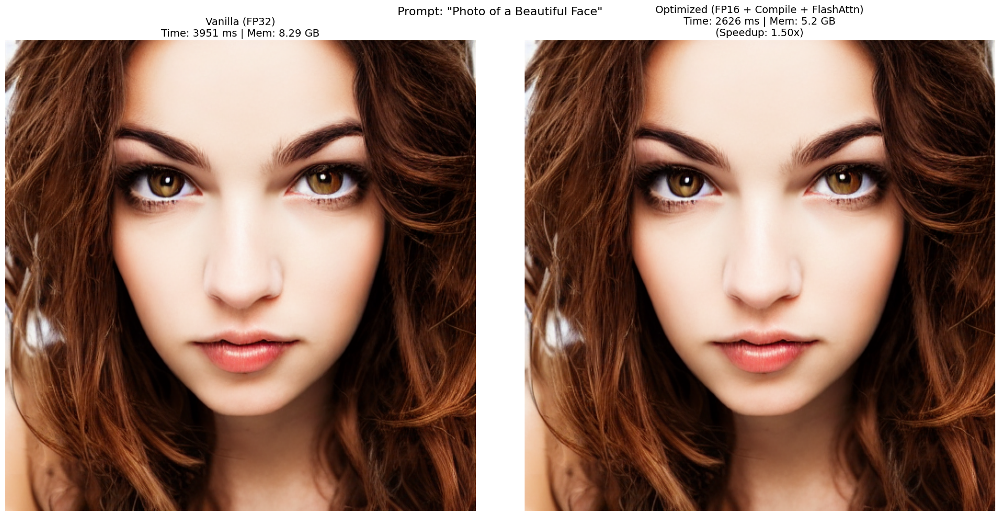


--- Processing Vanilla: "The Creation of Adam" in the style of Picasso ---
Assembling Vanilla Pipeline for picasso_vanilla.png...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saving to picasso_vanilla.png...
--- Processing Optimized: "The Creation of Adam" in the style of Picasso ---
1. Loading model...
2. Warming up, Compiling...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 64.81 ms
Average Forward Pass (per sample): 8.10 ms
Max Memory Used:      3.52 GB
Assembling Optimized Pipeline for picasso_optim.png...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saving to picasso_optim.png...


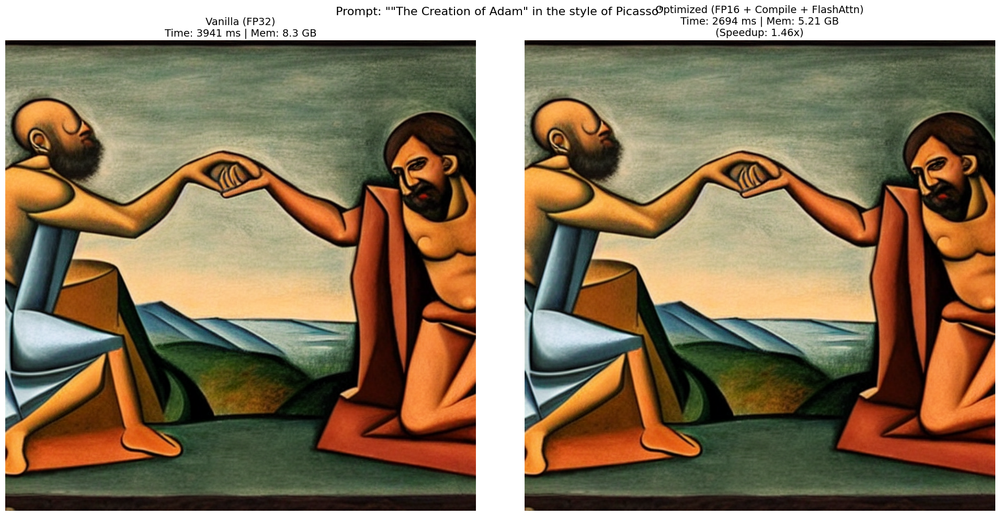


--- Processing Vanilla: Spaceshuttle with the TUM Logo ---
Assembling Vanilla Pipeline for spaceshuttle_vanilla.png...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saving to spaceshuttle_vanilla.png...
--- Processing Optimized: Spaceshuttle with the TUM Logo ---
1. Loading model...
2. Warming up, Compiling...
3. Running Benchmark (50 iterations)...
Average Forward Pass (per batch): 64.82 ms
Average Forward Pass (per sample): 8.10 ms
Max Memory Used:      3.53 GB
Assembling Optimized Pipeline for spaceshuttle_optim.png...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saving to spaceshuttle_optim.png...


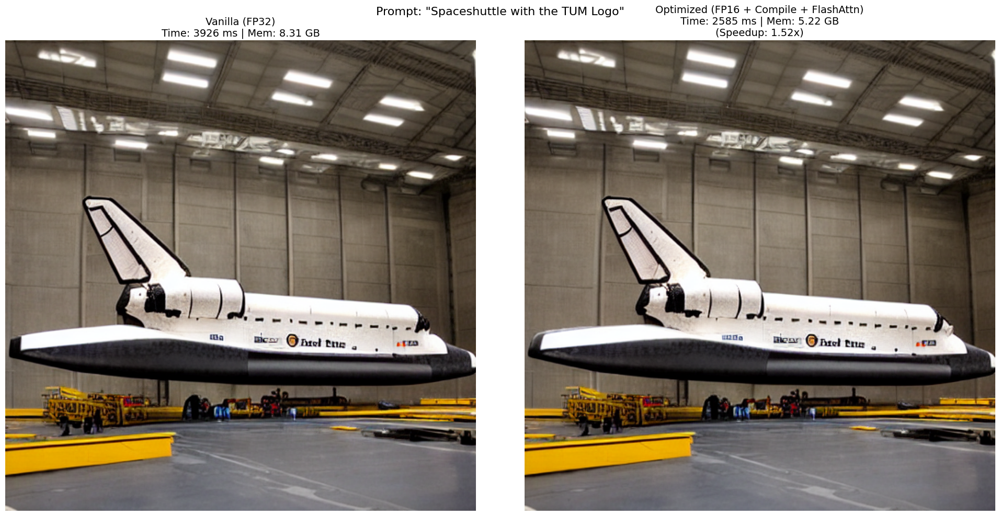

In [ ]:
from diffusers import StableDiffusionPipeline
from time import perf_counter
import torch
import matplotlib.pyplot as plt

# Ensure matplotlib graphs are shown inline
%matplotlib inline

def generate_image_with_unet(unet, prompt="Landscape Photo of the Alps", filename="landscape.png"):
    device = "cuda"

    if unet is None:
        print(f"Assembling Vanilla Pipeline for {filename}...")
        pipe = StableDiffusionPipeline.from_pretrained(
            "runwayml/stable-diffusion-v1-5",
            torch_dtype=torch.float32,
            use_safetensors=True
        ).to(device)
    else:
        print(f"Assembling Optimized Pipeline for {filename}...")
        pipe = StableDiffusionPipeline.from_pretrained(
            "runwayml/stable-diffusion-v1-5",
            unet=unet,
            torch_dtype=torch.float16,
            use_safetensors=True
        ).to(device)

    generator = torch.Generator(device).manual_seed(42)

    torch.cuda.reset_peak_memory_stats(device=device)
    torch.cuda.synchronize()
    start_time = perf_counter()

    with torch.inference_mode():
        image = pipe(
            prompt,
            num_inference_steps=50,
            guidance_scale=7.5,
            generator=generator
        ).images[0]

    torch.cuda.synchronize()
    end_time = perf_counter()
    max_memory = round(torch.cuda.max_memory_allocated(device=device) / 1000000000, 2)
    time_taken = end_time - start_time

    print(f"Saving to {filename}...")
    image.save(filename)

    return image, time_taken, max_memory

def compare_and_plot(prompt, filename_base):
    """
    Runs both vanilla and optimized generation, displays images side-by-side,
    and prints metrics.
    """
    # 1. Generate Vanilla
    print(f"\n--- Processing Vanilla: {prompt} ---")
    img_vanilla, time_vanilla, mem_vanilla = generate_image_with_unet(
        unet=None,
        prompt=prompt,
        filename=f"{filename_base}_vanilla.png"
    )
    cleanup()

    # 2. Generate Optimized
    # We call the optimization function here to get the model
    print(f"--- Processing Optimized: {prompt} ---")
    optim_unet = benchmark_flash_attention_python_timing_compile_channel_last()

    img_optim, time_optim, mem_optim = generate_image_with_unet(
        unet=optim_unet,
        prompt=prompt,
        filename=f"{filename_base}_optim.png"
    )
    cleanup()

    # 3. Plotting
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))

    # Vanilla Plot
    axs[0].imshow(img_vanilla)
    axs[0].set_title(f"Vanilla (FP32)\nTime: {time_vanilla * 1000:.0f} ms | Mem: {mem_vanilla} GB", fontsize=14)
    axs[0].axis('off')

    # Optimized Plot
    axs[1].imshow(img_optim)
    speedup = time_vanilla / time_optim
    axs[1].set_title(f"Optimized (FP16 + Compile + FlashAttn)\nTime: {time_optim * 1000:.0f} ms | Mem: {mem_optim} GB\n(Speedup: {speedup:.2f}x)", fontsize=14)
    axs[1].axis('off')

    plt.suptitle(f"Prompt: \"{prompt}\"", fontsize=16)
    plt.tight_layout()
    plt.show()

# --- Execution ---

compare_and_plot("Landscape Photo of the Alps", "alps")

compare_and_plot("Photo of a Beautiful Face", "face")

compare_and_plot("\"The Creation of Adam\" in the style of Picasso", "picasso")

compare_and_plot("Spaceshuttle with the TUM Logo", "spaceshuttle")